In [84]:
import numpy as np
import xarray as xr
import pandas as pd
import sys, os
from glob import glob 
# Gross fix this
sys.path.append(os.path.dirname(os.getcwd())); from utils import *

plt.rcParams['image.origin'] = 'lower'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

from scipy.signal import find_peaks

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [85]:
good_data_only = [
    ('20211014T120100Z', 'north half good'),
    ('20211014T123100Z', 'north half good. lighting exposure changes'),
    ('20211013T170100Z', 'some lighting'), 
    ('20211014T130100Z', 'north only, some low contrast'),
    ('20211028T153100Z', '')
]
array_8m = xr.load_dataset('../../../data/FRF-ocean_waves_8m-array_202110.nc')


3.072gb allocated


Building Timestack:   0%|          | 0/3840 [00:00<?, ?it/s]

Building Timestack: 100%|██████████| 3840/3840 [00:03<00:00, 985.45it/s] 


{'filename': '/Users/mleclair/Dropbox/phd/code/dunex/data/argus/ArgusFF_20211014T120100Z_RectifiedVideo.avi', 'key': '20211014T120100Z', 'good_data': [(120, 172), (778, 909), (1553, 2596)]} [0.43333333 1.09166667 8.69166667] min
3.072gb allocated


Building Timestack: 100%|██████████| 3840/3840 [00:03<00:00, 984.01it/s] 


{'filename': '/Users/mleclair/Dropbox/phd/code/dunex/data/argus/ArgusFF_20211014T123100Z_RectifiedVideo.avi', 'key': '20211014T123100Z', 'good_data': [(120, 994), (1718, 2548)]} [7.28333333 6.91666667] min
3.072gb allocated


Building Timestack: 100%|██████████| 3840/3840 [00:03<00:00, 990.00it/s] 


{'filename': '/Users/mleclair/Dropbox/phd/code/dunex/data/argus/ArgusFF_20211013T170100Z_RectifiedVideo.avi', 'key': '20211013T170100Z', 'good_data': [(120, 292)]} [1.43333333] min
3.072gb allocated


Building Timestack: 100%|██████████| 3840/3840 [00:04<00:00, 955.43it/s]


{'filename': '/Users/mleclair/Dropbox/phd/code/dunex/data/argus/ArgusFF_20211014T130100Z_RectifiedVideo.avi', 'key': '20211014T130100Z', 'good_data': [(120, 247), (741, 2444)]} [ 1.05833333 14.19166667] min
3.072gb allocated


Building Timestack: 100%|██████████| 3840/3840 [00:04<00:00, 944.60it/s]


{'filename': '/Users/mleclair/Dropbox/phd/code/dunex/data/argus/ArgusFF_20211028T153100Z_RectifiedVideo.avi', 'key': '20211028T153100Z', 'good_data': [(120, 129), (2361, 3093)]} [0.075 6.1  ] min


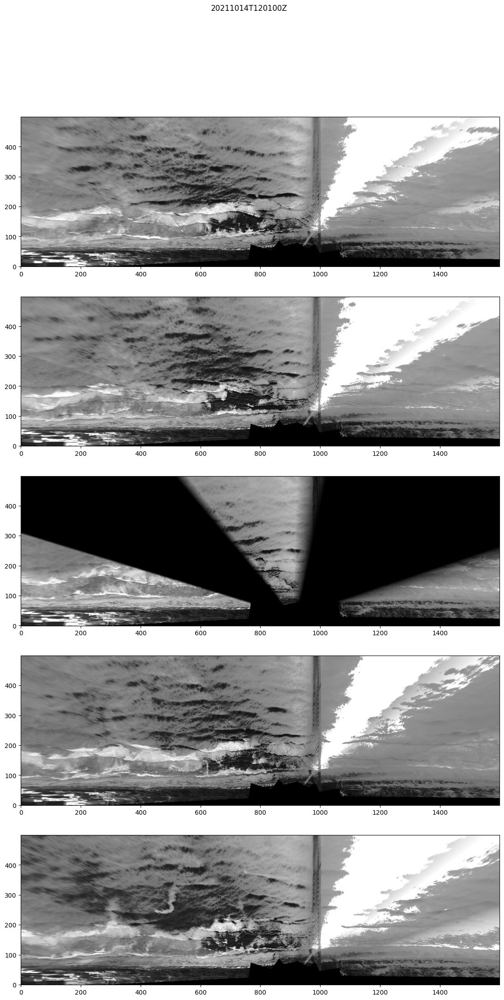

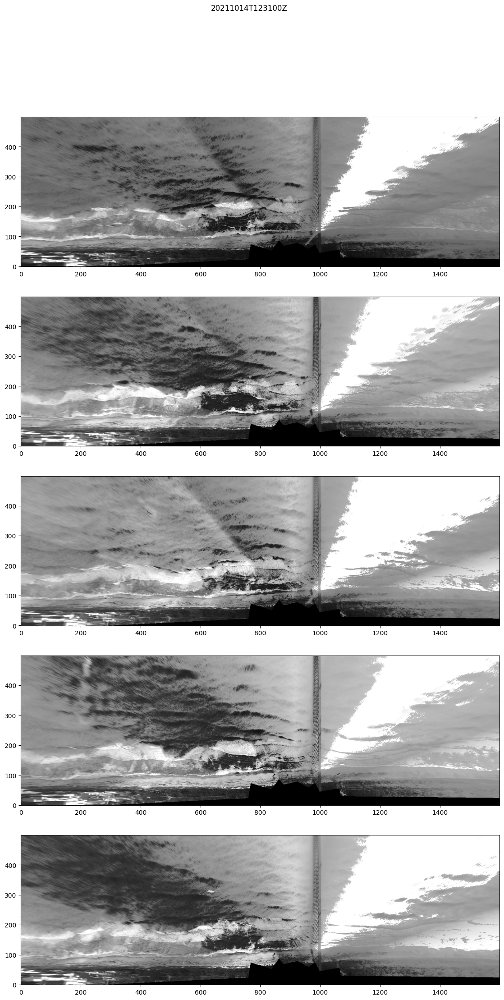

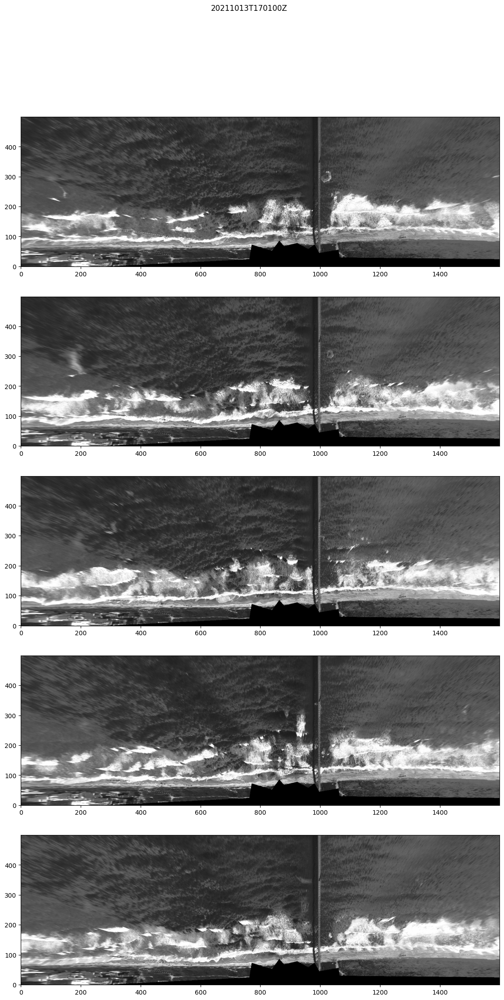

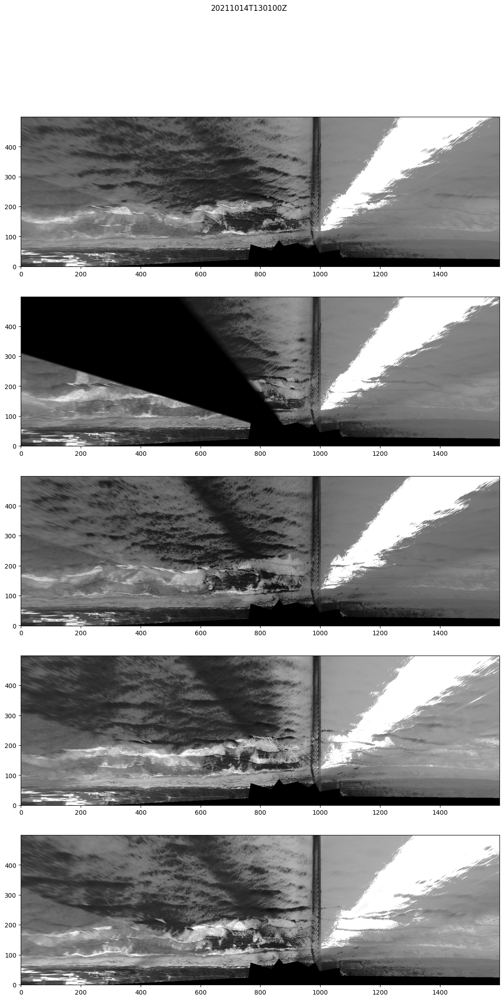

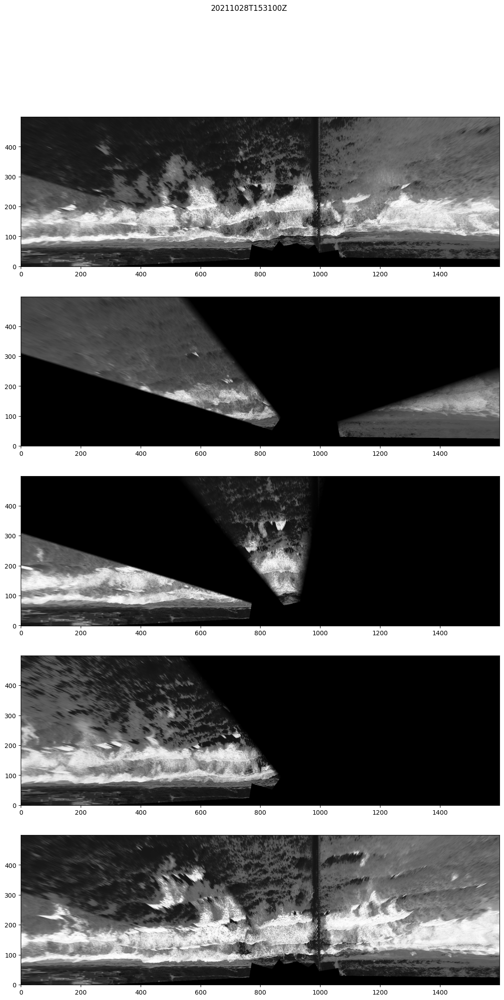

In [86]:
# Go through and find all the > SECONDS duration clips
data = []
SECONDS = 60
for time, _ in good_data_only:
    file = os.path.join('../../../data/argus', f'ArgusFF_{time}_RectifiedVideo.avi')
    N, W, H, FPS = get_video_shape(file)
    timestack = load_frames(file, dtype=np.uint8)
    
    bad_data = np.sum(timestack == 0, axis=2).sum(axis=1)
    good_data = bad_data == bad_data.min()
    edges = np.convolve((np.convolve(good_data, np.ones(FPS * SECONDS + 1)) == FPS * SECONDS + 1),np.array([1, -1]))

    start = np.where(edges == 1)[0]
    end =   np.where(edges == -1)[0]

    fig, axs = plt.subplots(5, 1, figsize=(20, 25))
    for i, ax in enumerate(axs):
        ax.imshow(timestack[i*end[-1]//5].T)
    fig.suptitle(time)
        
    
    data.append({
                'filename': os.path.abspath(file),
                'key': time,
                'good_data': list(zip(start, end)) 
            },
    )
    del timestack
    print(data[-1], (end-start)/FPS/60, 'min')

In [97]:
# Go through and find all the > SECONDS duration clips
import PIL
samples_per_clip = 5
duration = 120
SECONDS = 60
file_keys = {}
for time, _ in good_data_only:
    file = os.path.join('../../../data/argus', f'ArgusFF_{time}_RectifiedVideo.avi')
    N, W, H, FPS = get_video_shape(file)
    timestack = load_frames(file, dtype=np.uint8)
    
    bad_data = np.sum(timestack == 0, axis=2).sum(axis=1)
    good_data = bad_data == bad_data.min()
    edges = np.convolve((np.convolve(good_data, np.ones(FPS * SECONDS + 1)) == FPS * SECONDS + 1),np.array([1, -1]))

    start = np.where(edges == 1)[0]
    end   = np.where(edges == -1)[0]

    for s, e in tqdm(list(zip(start, end))):
        if e - s < 240:
            continue
        if time not in file_keys:
            file_keys[time] = [(s, e)]
        else:
            file_keys[time].append((s, e))
        for transect in np.random.random_integers(800, 1600, samples_per_clip):
            begin = np.random.random_integers((max(s, 1)), e-241, 1)[0]
            fin = begin + 256
            PIL.Image.fromarray(np.flip(timestack[begin:fin, transect-1].T, 0)).save(f'../../additional_data_from_south/{time}_t{s:05d}-{e:05d}_a{transect-1:04d}.png')
            PIL.Image.fromarray(np.flip(timestack[begin:fin, transect+0].T, 0)).save(f'../../additional_data_from_south/{time}_t{s:05d}-{e:05d}_a{transect+0:04d}.png')
            PIL.Image.fromarray(np.flip(timestack[begin:fin, transect+1].T, 0)).save(f'../../additional_data_from_south/{time}_t{s:05d}-{e:05d}_a{transect+1:04d}.png')
        
    del timestack

3.072gb allocated


Building Timestack:   0%|          | 0/3840 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]/var/folders/xv/4vxt441n3tz_yllzvqvzmsgw0000gr/T/ipykernel_66000/1150809680.py:26: DeprecationWarning: This function is deprecated. Please call randint(800, 1600 + 1) instead
  for transect in np.random.random_integers(800, 1600, samples_per_clip):
/var/folders/xv/4vxt441n3tz_yllzvqvzmsgw0000gr/T/ipykernel_66000/1150809680.py:27: DeprecationWarning: This function is deprecated. Please call randint(1553, 2355 + 1) instead
  begin = np.random.random_integers((max(s, 1)), e-241, 1)[0]
100%|██████████| 3/3 [00:00<00:00, 15.25it/s]


3.072gb allocated


  0%|          | 0/2 [00:00<?, ?it/s]/var/folders/xv/4vxt441n3tz_yllzvqvzmsgw0000gr/T/ipykernel_66000/1150809680.py:27: DeprecationWarning: This function is deprecated. Please call randint(120, 753 + 1) instead
  begin = np.random.random_integers((max(s, 1)), e-241, 1)[0]
 50%|█████     | 1/2 [00:00<00:00,  7.09it/s]/var/folders/xv/4vxt441n3tz_yllzvqvzmsgw0000gr/T/ipykernel_66000/1150809680.py:27: DeprecationWarning: This function is deprecated. Please call randint(1718, 2307 + 1) instead
  begin = np.random.random_integers((max(s, 1)), e-241, 1)[0]
100%|██████████| 2/2 [00:00<00:00,  7.08it/s]


3.072gb allocated


100%|██████████| 1/1 [00:00<00:00, 35544.95it/s]


3.072gb allocated


  0%|          | 0/2 [00:00<?, ?it/s]/var/folders/xv/4vxt441n3tz_yllzvqvzmsgw0000gr/T/ipykernel_66000/1150809680.py:27: DeprecationWarning: This function is deprecated. Please call randint(741, 2203 + 1) instead
  begin = np.random.random_integers((max(s, 1)), e-241, 1)[0]
100%|██████████| 2/2 [00:00<00:00,  9.14it/s]


3.072gb allocated


  0%|          | 0/2 [00:00<?, ?it/s]/var/folders/xv/4vxt441n3tz_yllzvqvzmsgw0000gr/T/ipykernel_66000/1150809680.py:27: DeprecationWarning: This function is deprecated. Please call randint(2361, 2852 + 1) instead
  begin = np.random.random_integers((max(s, 1)), e-241, 1)[0]
100%|██████████| 2/2 [00:00<00:00, 17.73it/s]


In [92]:
import json
class NpEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        if isinstance(obj, np.floating):
            return float(obj)
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        return super(NpEncoder, self).default(obj)

json.dump(file_keys, open(f'../../training_dataset/metadata.json', 'w'), cls=NpEncoder, indent=4)

In [39]:
from collections import defaultdict

def get_sequence_info(filepath):
    # Get the prefix (everything before _a) and frame number
    path_str = filepath.split('/')[-1]
    prefix = path_str.split('_a')[-2]
    frame_num = int(path_str.split('_a')[-1].replace('.png', ''))
    return prefix, frame_num


def find_continuous_sequences(numbers):
    if not numbers:
        return []
    
    numbers = sorted(numbers)  # Make sure numbers are sorted
    sequences = []
    current_seq = [numbers[0]]
    
    for prev, curr in zip(numbers, numbers[1:]):
        if curr == prev + 1:  # Numbers are consecutive
            current_seq.append(curr)
        else:
            # Sequence break - store if it exists and start new
            if current_seq:
                sequences.append(current_seq)
            current_seq = [curr]
    
    # Don't forget to add the last sequence
    if current_seq:
        sequences.append(current_seq)
    
    return sequences


def find_continuous_sequences(files):
    # Group by prefix
    prefix_groups = defaultdict(list)
    for filepath in files:
        prefix, frame_num = get_sequence_info(filepath)
        prefix_groups[prefix].append((frame_num, '/'.join(filepath.split('/')[-3:])))
    
    all_sequences = defaultdict(list)
    
    for prefix, frames in prefix_groups.items():
        frames.sort()  # Sort by frame number
        
        if not frames:
            continue
            
        
        # Initialize the first sequence
        current_sequence = [frames[0]]
        
        # Find continuous sequences
        for prev, curr in zip(frames, frames[1:]):
            if curr[0] == prev[0] + 1:  # Numbers are consecutive
                current_sequence.append(curr)
            else:
                # Sequence break - store the sequence if it exists
                if current_sequence:
                    all_sequences[get_datetime(prefix)].append([f[1] for f in current_sequence])
                # Start new sequence
                current_sequence = [curr]
        
        # Don't forget the last sequence
        if current_sequence:
            all_sequences[get_datetime(prefix)].append([f[1] for f in current_sequence])
    
    return all_sequences


In [98]:
from glob import glob
# files = glob('../../timestack_breakers_unet/cvat_annotations/triplets_fully_labeled/images/*')
files = glob('../../additional_data_from_south/*')
# files = [f for f in files if '20211014T120100Z_t1553-2596_a0389.png' not in f]
dataset_files = find_continuous_sequences(files)
from pprint import pprint




metadata = {}
for datetime, files in dataset_files.items():
    alongshore = []
    
    wave_conditions = array_8m.sel(time=t.tz_localize(None), method='nearest')
    metadata[datetime] = {
        # 'time': pd.Timestamp(datetime),
        'files': files,
        'array_8m': {
            'Hs': wave_conditions.waveHs.item(),
            'Tp': wave_conditions.waveTp.item(),
            'Tm': wave_conditions.waveTm.item(),
            'waterLevel': wave_conditions.waterLevel.item(),
            'directionalPeakSpread': wave_conditions.directionalPeakSpread.item(),
            'wavePrincipleDirection': wave_conditions.wavePrincipleDirection.item(),
            'waveMeanDirection': wave_conditions.waveMeanDirection.item(),
            'spectralWidthParameter': wave_conditions.spectralWidthParameter.item(),
        },
        'alongshore': [[int(file.split('_a')[-1].split('.png')[0]) for file in f] for f in files]
    }
pprint(metadata)


import json
json.dump(metadata, open('../../additional_data_from_south/metadata.json', 'w+'), indent=4)

{'20211014T120100Z': {'alongshore': [[1097, 1098, 1099],
                                     [1115, 1116, 1117],
                                     [1206, 1207, 1208],
                                     [1330, 1331, 1332],
                                     [1345, 1346, 1347],
                                     [1425, 1426, 1427],
                                     [1433, 1434, 1435],
                                     [1468, 1469, 1470],
                                     [1531, 1532, 1533],
                                     [1555, 1556, 1557]],
                      'array_8m': {'Hs': 0.8284242153167725,
                                   'Tm': 8.184789657592773,
                                   'Tp': 8.84466552734375,
                                   'directionalPeakSpread': 18.421157836914062,
                                   'spectralWidthParameter': 0.6367843151092529,
                                   'waterLevel': -0.36490386724472046,
                 

[[58, 59, 60], [69, 70, 71], [140, 141, 142], [205, 206, 207], [259, 260, 261], [594, 595, 596], [665, 666, 667], [756, 757, 758], [784, 785, 786], [817, 818, 819]]
[[62, 63, 64], [164, 165, 166], [203, 204, 205], [386, 387, 388], [418, 419, 420], [470, 471, 472], [588, 589, 590], [629, 630, 631], [970, 971, 972]]
[[47, 48, 49], [56, 57, 58], [62, 63, 64], [73, 74, 75], [161, 162, 163], [485, 486, 487], [493, 494, 495], [670, 671, 672], [683, 684, 685], [879, 880, 881], [117, 118, 119], [156, 157, 158], [461, 462, 463], [506, 507, 508], [560, 561, 562], [592, 593, 594], [724, 725, 726], [852, 853, 854], [920, 921, 922], [949, 950, 951]]
[[20, 21, 22], [136, 137, 138], [306, 307, 308], [341, 342, 343], [667, 668, 669], [717, 718, 719], [798, 799, 800], [923, 924, 925], [931, 932, 933], [956, 957, 958]]


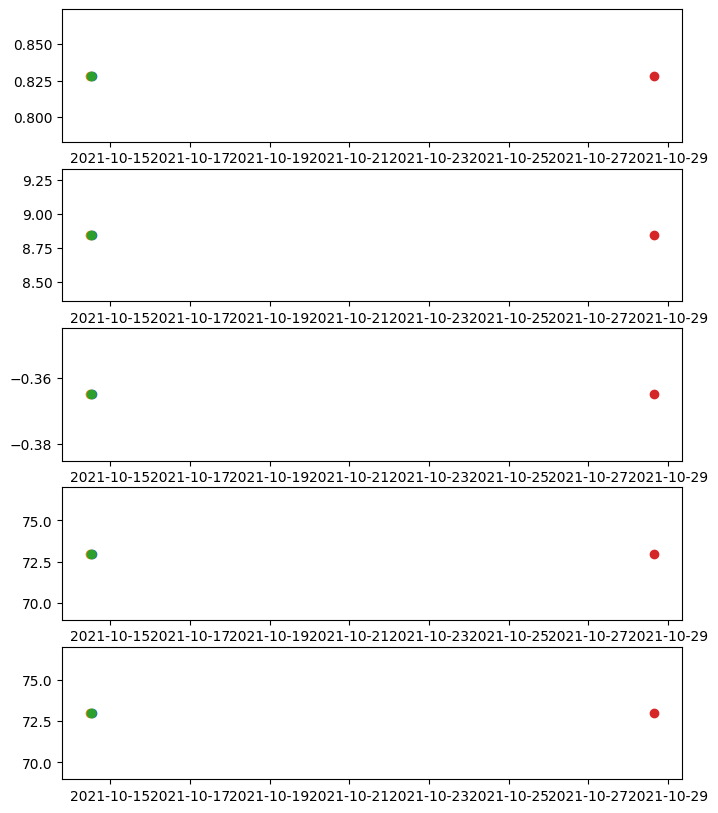

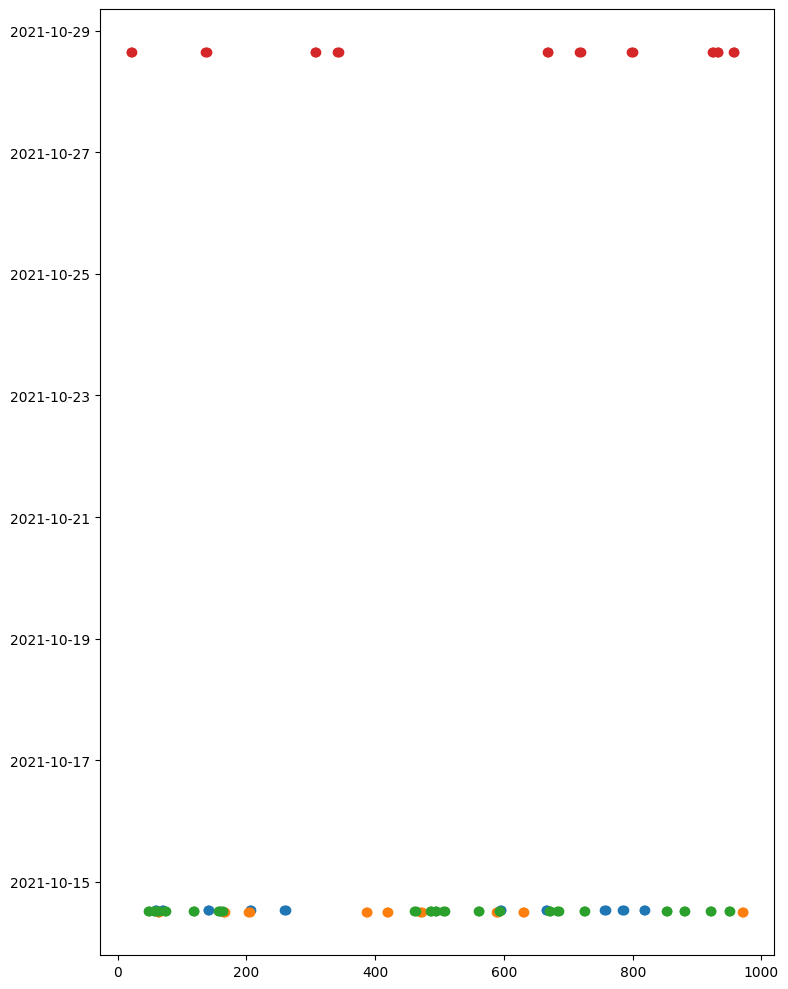

In [83]:
fig, axs = plt.subplots(5, 1, figsize=(8, 10))
fig, ax = plt.subplots(1, 1, figsize=(8, 10))


for k, v in metadata.items():
    axs[0].scatter(v['time'], v['array_8m']['Hs'])
    axs[1].scatter(v['time'], v['array_8m']['Tp'])
    axs[2].scatter(v['time'], v['array_8m']['waterLevel'])
    axs[3].scatter(v['time'], v['array_8m']['wavePrincipleDirection'])
    axs[4].scatter(v['time'], v['array_8m']['wavePrincipleDirection'])
    print(v['alongshore'])
    a = np.array(v['alongshore']).flatten().tolist()
    ax.scatter(a, [v['time']] * len(a))
    # plt.setp(axs[0].get_xticklabels(), rotation=35)

plt.tight_layout()

In [75]:
[v['time']] * len(v['alongshore'])

[Timestamp('2021-10-14 13:01:00+0000', tz='UTC'),
 Timestamp('2021-10-14 13:01:00+0000', tz='UTC'),
 Timestamp('2021-10-14 13:01:00+0000', tz='UTC'),
 Timestamp('2021-10-14 13:01:00+0000', tz='UTC'),
 Timestamp('2021-10-14 13:01:00+0000', tz='UTC'),
 Timestamp('2021-10-14 13:01:00+0000', tz='UTC'),
 Timestamp('2021-10-14 13:01:00+0000', tz='UTC'),
 Timestamp('2021-10-14 13:01:00+0000', tz='UTC'),
 Timestamp('2021-10-14 13:01:00+0000', tz='UTC'),
 Timestamp('2021-10-14 13:01:00+0000', tz='UTC')]

In [76]:
v['alongshore']

[[58, 59, 60],
 [69, 70, 71],
 [140, 141, 142],
 [205, 206, 207],
 [259, 260, 261],
 [594, 595, 596],
 [665, 666, 667],
 [756, 757, 758],
 [784, 785, 786],
 [817, 818, 819]]